In [1]:
import os
import json
import torch
import librosa
import torchaudio
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from IPython.display import Audio, display

In [2]:
plt.rcParams.update({'font.size': 10})

# Helpers functions

In [3]:
def _right_pad_if_necessary(signal):
    length_signal = signal.shape[1]
    if length_signal < num_samples:
        num_missing_samples = num_samples - length_signal
        last_dim_padding = (0, num_missing_samples)
        signal = torch.nn.functional.pad(signal, last_dim_padding)
    return signal

def _resample(signal, sr):
    if sr != sample_rate:
        resampler = torchaudio.transforms.Resample(sr, sample_rate)
        signal = resampler(signal)
    return signal

def get_signal(path, transpose=True):
    signal, sr = torchaudio.load(path)
    y_loaded = signal.numpy().copy()
    signal = _resample(signal, sr)
    signal = _right_pad_if_necessary(signal)
    signal = transformation(signal)
    signal = librosa.power_to_db(signal)
    signal = signal[:, :cut_dimensions[0], :cut_dimensions[1]]
    if transpose:
        signal = np.transpose(signal, (1, 2, 0)) # same transpose used during training
    return signal, y_loaded, sr

In [4]:
def read_local_analysis_log(file_loc):
    log_file = open(file_loc, 'r')
    
    for _ in range(10): # 10 for esc10 con 10 classi, 10 prototipi per classi. this n depends on this 2 parametrs i guess
        _ = log_file.readline()
        
    pred = int(log_file.readline()[len("Predicted: "):])
    actual = int(log_file.readline()[len("Actual: "):])
    
    log_file.close()
    return pred, actual

In [5]:
def read_info(info_file, classname_dict, per_class=False):
    sim_score_line = info_file.readline()
    connection_line = info_file.readline()
    proto_index_line = info_file.readline()
    
    sim_score = sim_score_line[len("similarity: "):-1]
    if per_class:
        cc = connection_line[len('last layer connection: '):-1]
    else:
        cc = connection_line[len('last layer connection with predicted class: '):-1]
        
    cc_dict = dict() 
    for i in range(len(classname_dict)):
        cc_line = info_file.readline()
        circ_cc_str = cc_line[len('proto connection to class ' + str(i+1) + ':tensor('):-(len(", device='cuda:0', grad_fn=<SelectBackward>)")+2)]
        circ_cc = float(circ_cc_str)
        cc_dict[i+1] = circ_cc

    class_of_p = max(cc_dict, key=lambda k: cc_dict[k])

    return sim_score, cc_dict, class_of_p

In [6]:
def get_isolated_prototype(spectrogram, hs, he, ws, we):
    prototype_spect = np.full(spectrogram.shape, np.min(spectrogram)) # creates empty spectrogram 
    prototype_spect[hs:he,ws:we,0] = spectrogram[hs:he,ws:we,0] # copying from spectrogram to empty in the bounding box region
    return prototype_spect

In [7]:
# filtering audio on prototype start and end (only on the time-axis)
def get_y_start_end_coordinates(y, spect_dim, ws, we):
    start = int((len(y[0]) * ws) / spect_dim)
    end = int((len(y[0]) * we) / spect_dim)
    return start, end

In [8]:
# recover the frequency index (spectrum space) from the mel spect index bounding box (mel spect space)
def get_frequency_from_melbin(mel_filters_bank, mel):
    if mel == n_mels: # maximum index in the filter banks matrix
        mel -= 1
        
    return int(np.argmax(mel_filters_bank[:, mel]).numpy())

In [9]:
def display_audio(y, sr):
    display(Audio(data=y, rate=sr))

In [10]:
def get_isolated_prototype_audio(file_path, hs, he):
    y_proto, _ = torchaudio.load(file_path)
    sp = spectrogram_transform(y_proto) 
    
    hs_f = get_frequency_from_melbin(mel_filters_bank, hs)
    he_f = get_frequency_from_melbin(mel_filters_bank, he)
    
    # filtering on the height in the spectrum space, dimensions here are (1, h, w)
    prototype_spect = np.full(sp.shape, np.min(sp.numpy()))
    prototype_spect[0, hs_f:he_f, :] = sp[0, hs_f:he_f, :]
    
    reconstructed_prototype_y = griffin_lim(torch.tensor(prototype_spect))
    return reconstructed_prototype_y

In [11]:
## N: number of prototypes to show per class, if k is not given these are the tom N most activated
## k: top k class; if k is given the top N prototypes for the kth class are shown
def show_prototypes(pred, truth, classname_dict, labels_dict, test_spect, y, sr, mel_filters_bank, N, k=None):

    if k:
        prototype_dir = os.path.join(source_dir, f'top-{k}_class_prototypes')
    else:
        prototype_dir = os.path.join(source_dir, 'most_activated_prototypes')

    for top_p in range(1, N+1): 
        # info about simscore, class connections (towards predicted and prototype specific class)
        p_info_file = open(os.path.join(prototype_dir, f'top-{top_p}_activated_prototype.txt'), 'r')
        sim_score, cc_dict, top_cc = read_info(p_info_file, classname_dict, per_class=True)
        
        # isolated prototype on test spect 
        hs, he, ws, we = np.load(os.path.join(prototype_dir, f'most_highly_activated_patch_in_original_img_by_top-{top_p}_prototype_bboxes.npy')) 
        prototype_spect_test = get_isolated_prototype(test_spect, hs, he, ws, we)
        # isolate prototype audio in test spect
        # reconstructed_y_test = get_isolated_prototype_audio(test_file_path, hs, he)
        reconstructed_y_test = get_isolated_prototype_audio(os.path.join(source_dir, test_file_path), hs, he)
        
        start_y_test, end_y_test = get_y_start_end_coordinates(y, n_mels, ws, we)
        prototype_test_y = reconstructed_y_test[0][start_y_test:end_y_test] # filtering on the correct time
        
        # test image activation by prototype normed
        p_act_img = Image.open(os.path.join(prototype_dir, f'prototype_activation_map_by_top-{top_p}_prototype_normed.png'))
    
        # top-n activated prototype in training training spectrogram
        training_spect = np.load(os.path.join(prototype_dir, f'top-{top_p}_activated_prototype_full_size.npy'))
    
        # path for the original training audio sample 
        training_sample_path = os.path.join(prototype_dir, f'top-{top_p}_training_sample.wav')
        spect_mostsim_from_train, y_mostsim_from_train, sr_mostsim_from_train = get_signal(training_sample_path, True)
        
        # isolated prototype on train spect
        hs, he, ws, we = np.load(os.path.join(prototype_dir, f'top-{top_p}_activated_prototype_in_original_pimg_bboxes.npy')) 
        prototype_spect_train = get_isolated_prototype(training_spect, hs, he, ws, we)
        # isolate prototype audio in train spect
        reconstructed_y_train = get_isolated_prototype_audio(training_sample_path, hs, he)
        start_y_train, end_y_train = get_y_start_end_coordinates(y_mostsim_from_train, n_mels, ws, we)
        prototype_train_y = reconstructed_y_train[0][start_y_train:end_y_train] # filtering on the correct time
    
        # self-activation of prototypes in train spect
        p_act_img_train = Image.open(os.path.join(prototype_dir, f'top-{top_p}_activated_prototype_self_act.png'))
    
        ######################
        ## GENERATING PLOTS ##
        ######################
        
        fig, axs = plt.subplots(1, 6, figsize=(15, 15))
        axs[0].imshow(test_spect[:,:,0], origin='lower')
        axs[0].set_title('Test spectrogram')
    
        axs[1].imshow(prototype_spect_test[:,:,0], origin='lower')
        axs[1].set_title('Prototype \n in test spectrogram')
    
        axs[2].imshow(p_act_img)
        axs[2].set_title('Prototype activation \n in test spectrogram')
    
        axs[3].imshow(training_spect, origin='lower')
        axs[3].set_title('Most activated \n training image')
    
        axs[4].imshow(prototype_spect_train[:,:,0], origin='lower')
        axs[4].set_title('Prototype \n in train spectrogram')
    
        axs[5].imshow(p_act_img_train)
        axs[5].set_title('Prototype Self-activation \n in train spectrogram')
        
        for ax in axs:
            ax.axis('off')
    
        fig.tight_layout()
        plt.show()
    
        ## additional info ## 
        
        print("Similarity score:", sim_score)
        print("Class connection to predicted class:", cc_dict[pred])
        print("Contribution to predicted class:", float(sim_score) * cc_dict[pred])
        
        if top_cc != pred:
            print("Class connection to prototype own class (%s): %f" % (labels_dict[str(top_cc)], cc_dict[top_cc]))
            print("Contribution to prototype own class (%s): %f" % (labels_dict[str(top_cc)], float(sim_score) * cc_dict[top_cc]))

        ## play audio files ## 
        
        print("\nTest audio")
        display_audio(y, sr)
    
        print("\n Prototype in Test audio")    
        display_audio(prototype_test_y, sr)
    
        print("\nTraining audio")
        display_audio(y_mostsim_from_train, sr_mostsim_from_train)
    
        print("\n Prototype in Training audio")    
        display_audio(prototype_train_y, sr_mostsim_from_train)
    
        # print("==============================================================================================================================")
        # print("==============================================================================================================================")
        

In [12]:
num_rows = 3

# Experiments Explanations

## GTZAN

In [13]:
# defining dataset dir
dataset_dir = 'GTZAN'

# spectrogram conversion parameters 
sample_rate = 41000
num_samples = 41000
n_fft = 4096 * 3
hop_length = 700
n_mels = 350

cut_dimensions = [n_mels, n_mels]

# spectrogram transformations to melspectrogram
transformation = torchaudio.transforms.MelSpectrogram(
    sample_rate=sample_rate,
    n_fft=n_fft,
    hop_length=hop_length,
    n_mels=n_mels
)

# useful for spectrogram conversion and back soundification without quality loss
win_length = n_fft 

# spectrogram transformation (can be back converted to audio without loss)
spectrogram_transform = torchaudio.transforms.Spectrogram(n_fft=n_fft,win_length=win_length,hop_length=hop_length)

# reverse spectrogram to waveform with griffinlim
griffin_lim = torchaudio.transforms.GriffinLim(n_fft=n_fft,win_length=win_length,hop_length=hop_length)

Analysing jazz.00006_2.wav audio file
************************************************************
This jazz is classified as blues!
************************************************************
************************************************************
Top 5 most activated prototypes overall
************************************************************


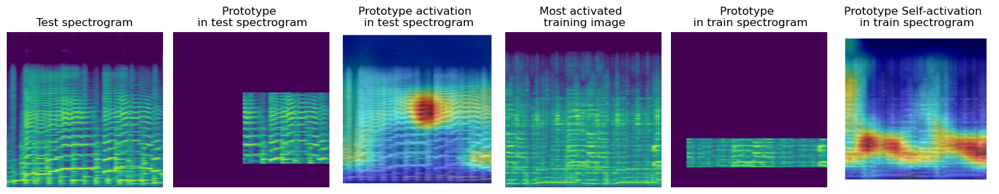

Similarity score: 5.614
Class connection to predicted class: -0.5759
Contribution to predicted class: -3.2331025999999996
Class connection to prototype own class (reggae): 1.087700
Contribution to prototype own class (reggae): 6.106348

Test audio



 Prototype in Test audio



Training audio



 Prototype in Training audio


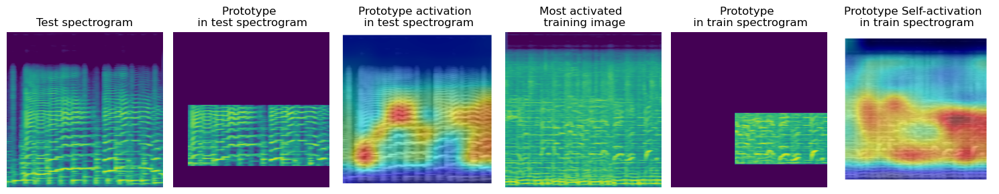

Similarity score: 5.094
Class connection to predicted class: -0.6087
Contribution to predicted class: -3.1007178000000004
Class connection to prototype own class (country): 0.915800
Contribution to prototype own class (country): 4.665085

Test audio



 Prototype in Test audio



Training audio



 Prototype in Training audio


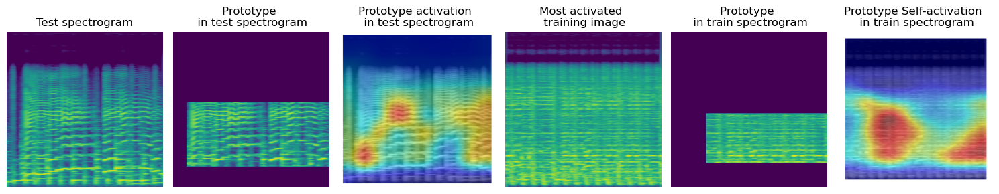

Similarity score: 4.877
Class connection to predicted class: 0.8438
Contribution to predicted class: 4.1152125999999996

Test audio



 Prototype in Test audio



Training audio



 Prototype in Training audio


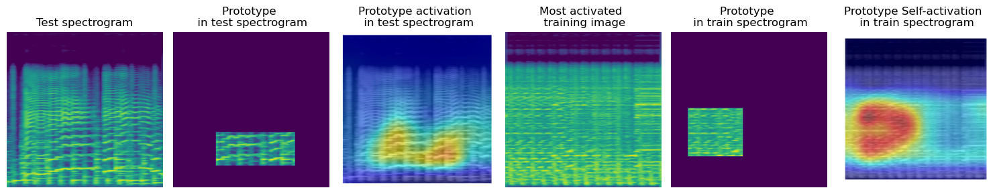

Similarity score: 3.893
Class connection to predicted class: 0.826
Contribution to predicted class: 3.2156179999999996

Test audio



 Prototype in Test audio



Training audio



 Prototype in Training audio


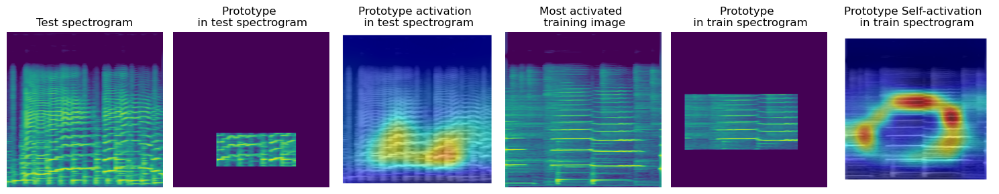

Similarity score: 3.779
Class connection to predicted class: -0.6907
Contribution to predicted class: -2.6101552999999997
Class connection to prototype own class (jazz): 1.100400
Contribution to prototype own class (jazz): 4.158412

Test audio



 Prototype in Test audio



Training audio



 Prototype in Training audio


************************************************************
Top 3 most activated prototypes for top-1 class
************************************************************


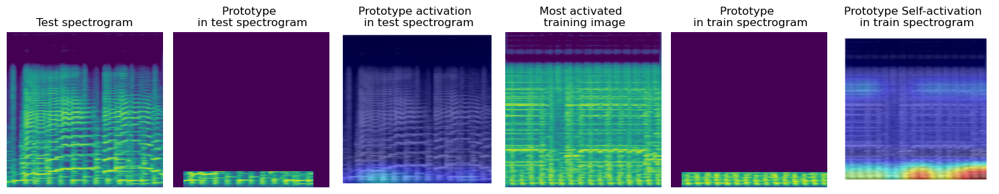

Similarity score: 2.001
Class connection to predicted class: 0.7898
Contribution to predicted class: 1.5803897999999998

Test audio



 Prototype in Test audio



Training audio



 Prototype in Training audio


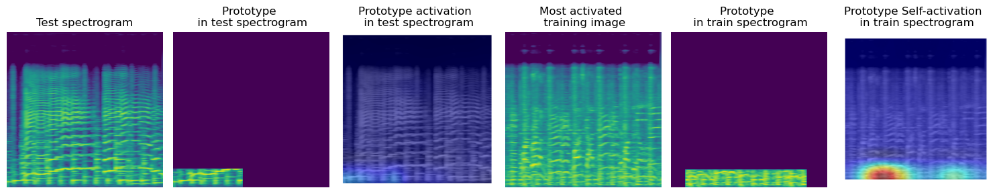

Similarity score: 1.713
Class connection to predicted class: 0.9227
Contribution to predicted class: 1.5805851

Test audio



 Prototype in Test audio



Training audio



 Prototype in Training audio


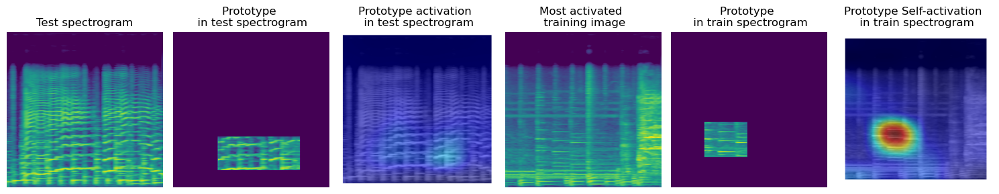

Similarity score: 1.637
Class connection to predicted class: 0.7005
Contribution to predicted class: 1.1467185

Test audio



 Prototype in Test audio



Training audio



 Prototype in Training audio


************************************************************
Top 3 most activated prototypes for top-2 class
************************************************************


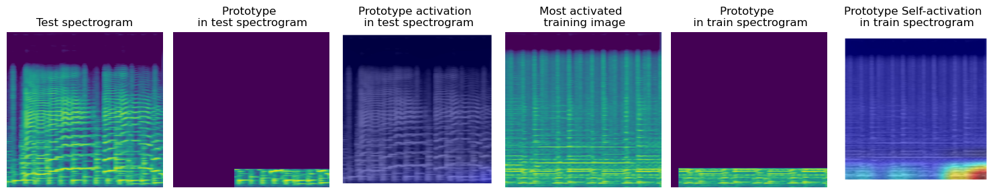

Similarity score: 0.589
Class connection to predicted class: -0.7092
Contribution to predicted class: -0.4177188
Class connection to prototype own class (jazz): 1.124600
Contribution to prototype own class (jazz): 0.662389

Test audio



 Prototype in Test audio



Training audio



 Prototype in Training audio


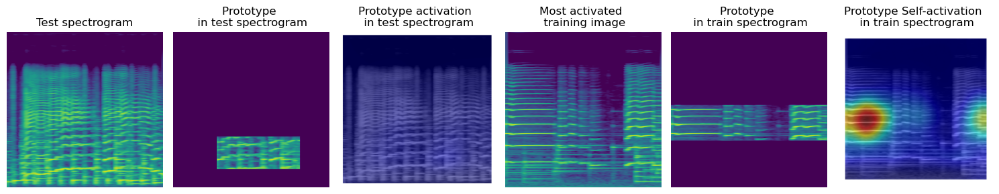

Similarity score: 0.446
Class connection to predicted class: -0.6456
Contribution to predicted class: -0.28793759999999996
Class connection to prototype own class (jazz): 1.075200
Contribution to prototype own class (jazz): 0.479539

Test audio



 Prototype in Test audio



Training audio



 Prototype in Training audio


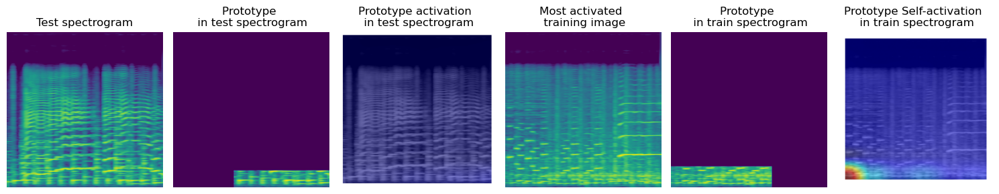

Similarity score: 0.362
Class connection to predicted class: -0.6702
Contribution to predicted class: -0.2426124
Class connection to prototype own class (jazz): 1.089700
Contribution to prototype own class (jazz): 0.394471

Test audio



 Prototype in Test audio



Training audio



 Prototype in Training audio


************************************************************
Top 3 most activated prototypes for top-3 class
************************************************************


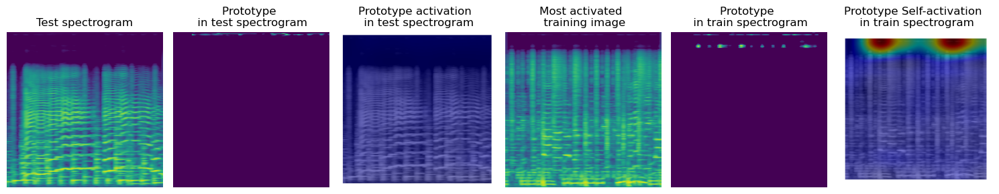

Similarity score: 0.402
Class connection to predicted class: -0.6089
Contribution to predicted class: -0.24477780000000002
Class connection to prototype own class (reggae): 0.903800
Contribution to prototype own class (reggae): 0.363328

Test audio



 Prototype in Test audio



Training audio



 Prototype in Training audio


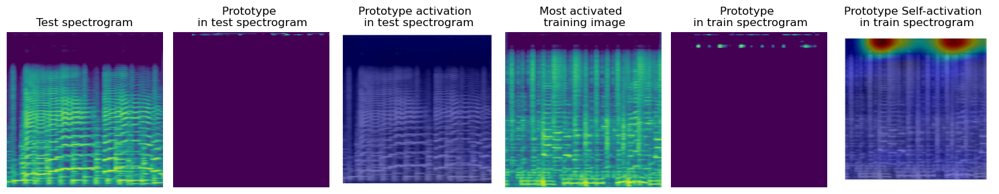

Similarity score: 0.389
Class connection to predicted class: -0.6276
Contribution to predicted class: -0.24413640000000003
Class connection to prototype own class (reggae): 0.916000
Contribution to prototype own class (reggae): 0.356324

Test audio



 Prototype in Test audio



Training audio



 Prototype in Training audio


In [ ]:
for test_file_path in os.listdir(dataset_dir)[0:2]:
    print("============================================================")
    print("Analysing %s audio file" % test_file_path)
    print("============================================================")
    source_dir = os.path.join(dataset_dir, test_file_path)

    # loading class name dict 
    classname_dict = json.load(open(os.path.join(source_dir, 'classname_dict.json')))
    
    # loading labels class dict
    labels_dict = json.load(open(os.path.join(source_dir, 'inv_class_labels_map.json')))
    
    # load test spectrogram
    test_spect, y, sr = get_signal(os.path.join(source_dir, test_file_path), True)
    
    # Triangular filter banks (fb matrix) of size (n_freqs, n_mels), each column is a filterbank.
    mel_filters_bank = torchaudio.functional.melscale_fbanks(
        n_freqs = n_fft // 2 + 1, 
        f_min = 0,
        f_max = sr // 2,
        n_mels = n_mels, 
        sample_rate = sr, 
    )
    
    # get true and predicted class
    pred, truth = read_local_analysis_log(os.path.join(source_dir, 'local_analysis.log'))
    print("************************************************************")
    print("This %s is classified as %s!" % (labels_dict[str(truth)], labels_dict[str(pred)]))
    print("************************************************************")

    print("************************************************************")
    print("Top 5 most activated prototypes overall")
    print("************************************************************")
    # top 5 most acticated prototypes overall
    show_prototypes(pred, truth, classname_dict, labels_dict, test_spect, y, sr, mel_filters_bank, N=5)

    print("************************************************************")
    print("Top 3 most activated prototypes for top-1 class")
    print("************************************************************")
    # top 3 most acticated prototypes for the top-1 class
    show_prototypes(pred, truth, classname_dict, labels_dict, test_spect, y, sr, mel_filters_bank, N=3, k=1)

    print("************************************************************")
    print("Top 3 most activated prototypes for top-2 class")
    print("************************************************************")
    # top 3 most acticated prototypes for the top-2 class
    show_prototypes(pred, truth, classname_dict, labels_dict, test_spect, y, sr, mel_filters_bank, N=3, k=2)

    print("************************************************************")
    print("Top 3 most activated prototypes for top-3 class")
    print("************************************************************")
    # top 3 most acticated prototypes for the top-3 class
    show_prototypes(pred, truth, classname_dict, labels_dict, test_spect, y, sr, mel_filters_bank, N=3, k=3)

## MEDLEY

In [ ]:
# defining dataset dir
dataset_dir = 'MEDLEY'

# spectrogram conversion parameters 
sample_rate = 41000
num_samples = 41000
n_fft = 4096 * 3
hop_length = 500
n_mels = 240

cut_dimensions = [n_mels, n_mels]

# spectrogram transformations to melspectrogram
transformation = torchaudio.transforms.MelSpectrogram(
    sample_rate=sample_rate,
    n_fft=n_fft,
    hop_length=hop_length,
    n_mels=n_mels
)

# useful for spectrogram conversion and back soundification without quality loss
win_length = n_fft 

# spectrogram transformation (can be back converted to audio without loss)
spectrogram_transform = torchaudio.transforms.Spectrogram(n_fft=n_fft,win_length=win_length,hop_length=hop_length)

# reverse spectrogram to waveform with griffinlim
griffin_lim = torchaudio.transforms.GriffinLim(n_fft=n_fft,win_length=win_length,hop_length=hop_length)

In [ ]:
for test_file_path in os.listdir(dataset_dir)[0:2]:
    print("============================================================")
    print("Analysing %s audio file" % test_file_path)
    print("============================================================")
    source_dir = os.path.join(dataset_dir, test_file_path)

    # loading class name dict 
    classname_dict = json.load(open(os.path.join(source_dir, 'classname_dict.json')))
    
    # loading labels class dict
    labels_dict = json.load(open(os.path.join(source_dir, 'inv_class_labels_map.json')))
    
    # load test spectrogram
    test_spect, y, sr = get_signal(os.path.join(source_dir, test_file_path), True)
    
    # Triangular filter banks (fb matrix) of size (n_freqs, n_mels), each column is a filterbank.
    mel_filters_bank = torchaudio.functional.melscale_fbanks(
        n_freqs = n_fft // 2 + 1, 
        f_min = 0,
        f_max = sr // 2,
        n_mels = n_mels, 
        sample_rate = sr, 
    )
    
    # get true and predicted class
    pred, truth = read_local_analysis_log(os.path.join(source_dir, 'local_analysis.log'))
    print("************************************************************")
    print("This %s is classified as %s!" % (labels_dict[str(truth)], labels_dict[str(pred)]))
    print("************************************************************")

    print("************************************************************")
    print("Top 5 most activated prototypes overall")
    print("************************************************************")
    # top 5 most acticated prototypes overall
    show_prototypes(pred, truth, classname_dict, labels_dict, test_spect, y, sr, mel_filters_bank, N=5)

    print("************************************************************")
    print("Top 3 most activated prototypes for top-1 class")
    print("************************************************************")
    # top 3 most acticated prototypes for the top-1 class
    show_prototypes(pred, truth, classname_dict, labels_dict, test_spect, y, sr, mel_filters_bank, N=3, k=1)

    print("************************************************************")
    print("Top 3 most activated prototypes for top-2 class")
    print("************************************************************")
    # top 3 most acticated prototypes for the top-2 class
    show_prototypes(pred, truth, classname_dict, labels_dict, test_spect, y, sr, mel_filters_bank, N=3, k=2)

    print("************************************************************")
    print("Top 3 most activated prototypes for top-3 class")
    print("************************************************************")
    # top 3 most acticated prototypes for the top-3 class
    show_prototypes(pred, truth, classname_dict, labels_dict, test_spect, y, sr, mel_filters_bank, N=3, k=3)

## ESC50

In [ ]:
# defining dataset dir
dataset_dir = 'ESC50'

# spectrogram conversion parameters 
sample_rate = 41000
num_samples = 41000
n_fft = 4096 * 3
hop_length = 600
n_mels = 300

cut_dimensions = [n_mels, n_mels]

# spectrogram transformations to melspectrogram
transformation = torchaudio.transforms.MelSpectrogram(
    sample_rate=sample_rate,
    n_fft=n_fft,
    hop_length=hop_length,
    n_mels=n_mels
)

# useful for spectrogram conversion and back soundification without quality loss
win_length = n_fft 

# spectrogram transformation (can be back converted to audio without loss)
spectrogram_transform = torchaudio.transforms.Spectrogram(n_fft=n_fft,win_length=win_length,hop_length=hop_length)

# reverse spectrogram to waveform with griffinlim
griffin_lim = torchaudio.transforms.GriffinLim(n_fft=n_fft,win_length=win_length,hop_length=hop_length)

In [ ]:
for test_file_path in os.listdir(dataset_dir):
    print("============================================================")
    print("Analysing %s audio file" % test_file_path)
    print("============================================================")
    source_dir = os.path.join(dataset_dir, test_file_path)

    # loading class name dict 
    classname_dict = json.load(open(os.path.join(source_dir, 'classname_dict.json')))
    
    # loading labels class dict
    labels_dict = json.load(open(os.path.join(source_dir, 'inv_class_labels_map.json')))
    
    # load test spectrogram
    test_spect, y, sr = get_signal(os.path.join(source_dir, test_file_path), True)
    
    # Triangular filter banks (fb matrix) of size (n_freqs, n_mels), each column is a filterbank.
    mel_filters_bank = torchaudio.functional.melscale_fbanks(
        n_freqs = n_fft // 2 + 1, 
        f_min = 0,
        f_max = sr // 2,
        n_mels = n_mels, 
        sample_rate = sr, 
    )
    
    # get true and predicted class
    pred, truth = read_local_analysis_log(os.path.join(source_dir, 'local_analysis.log'))
    print("************************************************************")
    print("This %s is classified as %s!" % (labels_dict[str(truth)], labels_dict[str(pred)]))
    print("************************************************************")

    print("************************************************************")
    print("Top 5 most activated prototypes overall")
    print("************************************************************")
    # top 5 most acticated prototypes overall
    show_prototypes(pred, truth, classname_dict, labels_dict, test_spect, y, sr, mel_filters_bank, N=5)

    print("************************************************************")
    print("Top 3 most activated prototypes for top-1 class")
    print("************************************************************")
    # top 3 most acticated prototypes for the top-1 class
    show_prototypes(pred, truth, classname_dict, labels_dict, test_spect, y, sr, mel_filters_bank, N=3, k=1)

    print("************************************************************")
    print("Top 3 most activated prototypes for top-2 class")
    print("************************************************************")
    # top 3 most acticated prototypes for the top-2 class
    show_prototypes(pred, truth, classname_dict, labels_dict, test_spect, y, sr, mel_filters_bank, N=3, k=2)

    print("************************************************************")
    print("Top 3 most activated prototypes for top-3 class")
    print("************************************************************")
    # top 3 most acticated prototypes for the top-3 class
    show_prototypes(pred, truth, classname_dict, labels_dict, test_spect, y, sr, mel_filters_bank, N=3, k=3)